In [32]:
import scipy.stats
import scipy
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(rc={"figure.facecolor": "white"})

TEST_LOCATION = "./COMP30027_2021_Project2_datasets/recipe_test.csv"
TRAIN_LOCATION = "./COMP30027_2021_Project2_datasets/recipe_train.csv"

def preprocess(csv_location: str) -> pd.DataFrame:
    # Change 9999 to np.nan when reading in the data
    data = pd.read_csv(csv_location, header = 0) 
    return data

def create_csv_output(file_name: str, result: np.ndarray):
    output = pd.DataFrame({"duration_label": result})
    output.index += 1
    output.to_csv(file_name + ".csv", index_label = "id")

def get_training(train_loc: str):
    train = preprocess(train_loc)
    X = train.iloc[:, :-1]
    y = train.iloc[:, -1]
    return (X, y)

def convert_to_proper_output(file_name: str):
    old = pd.read_csv(file_name + ".csv", header = 0)
    old.index += 1
    old.to_csv(file_name + "-new.csv", index_label = "id")

In [33]:
#Loading in the datasets within the zip files based on steps in README
import pickle

BASE_LOCATION = "./COMP30027_2021_Project2_datasets/"
COUNT_VEC_LOCATION = BASE_LOCATION + "recipe_text_features_countvec/"
DOC2VEC50_VEC_LOCATION = BASE_LOCATION + "recipe_text_features_doc2vec50/"
DOC2VEC100_VEC_LOCATION = BASE_LOCATION + "recipe_text_features_doc2vec100/"

#countvecs are essentially a one-hot-encoding of the most popular words.
train_name_countvec = pickle.load(open(COUNT_VEC_LOCATION + "train_name_countvectorizer.pkl", "rb"))
train_ingr_countvec = pickle.load(open(COUNT_VEC_LOCATION + "train_ingr_countvectorizer.pkl", "rb"))
train_steps_countvec = pickle.load(open(COUNT_VEC_LOCATION + "train_steps_countvectorizer.pkl", "rb"))

#bag-of-word sparse matrices. Similar to one-hot-encoding but for all words.
#column = word occurence, row = individual instance
train_name_vec = scipy.sparse.load_npz(COUNT_VEC_LOCATION + 'train_name_vec.npz')
train_ingr_vec = scipy.sparse.load_npz(COUNT_VEC_LOCATION + 'train_ingr_vec.npz')
train_steps_vec = scipy.sparse.load_npz(COUNT_VEC_LOCATION + 'train_steps_vec.npz')

test_name_vec = scipy.sparse.load_npz(COUNT_VEC_LOCATION + 'test_name_vec.npz')
test_ingr_vec = scipy.sparse.load_npz(COUNT_VEC_LOCATION + 'test_ingr_vec.npz')
test_steps_vec = scipy.sparse.load_npz(COUNT_VEC_LOCATION + 'test_steps_vec.npz')

#Doc2Vec representation with 50 features. Think of them as 50 dimensional vectors representing the words/phrases
test_name_vec50 = pd.read_csv(DOC2VEC50_VEC_LOCATION + "test_name_doc2vec50.csv", index_col = False, delimiter = ',', header=None)
test_ingr_vec50 = pd.read_csv(DOC2VEC50_VEC_LOCATION + "test_ingr_doc2vec50.csv", index_col = False, delimiter = ',', header=None)
test_steps_vec50 = pd.read_csv(DOC2VEC50_VEC_LOCATION + "test_steps_doc2vec50.csv", index_col = False, delimiter = ',', header=None)

train_name_vec50 = pd.read_csv(DOC2VEC50_VEC_LOCATION + "train_name_doc2vec50.csv", index_col = False, delimiter = ',', header=None)
train_ingr_vec50 = pd.read_csv(DOC2VEC50_VEC_LOCATION + "train_ingr_doc2vec50.csv", index_col = False, delimiter = ',', header=None)
train_steps_vec50 = pd.read_csv(DOC2VEC50_VEC_LOCATION + "train_steps_doc2vec50.csv", index_col = False, delimiter = ',', header=None)

#Doc2Vec representation with 100 features. Think of them as 100 dimensional vectors representing the words/phrases
test_name_vec100 = pd.read_csv(DOC2VEC100_VEC_LOCATION + "test_name_doc2vec100.csv", index_col = False, delimiter = ',', header=None)
test_ingr_vec100 = pd.read_csv(DOC2VEC100_VEC_LOCATION + "test_ingr_doc2vec100.csv", index_col = False, delimiter = ',', header=None)
test_steps_vec100 = pd.read_csv(DOC2VEC100_VEC_LOCATION + "test_steps_doc2vec100.csv", index_col = False, delimiter = ',', header=None)

train_name_vec100 = pd.read_csv(DOC2VEC100_VEC_LOCATION + "train_name_doc2vec100.csv", index_col = False, delimiter = ',', header=None)
train_ingr_vec100 = pd.read_csv(DOC2VEC100_VEC_LOCATION + "train_ingr_doc2vec100.csv", index_col = False, delimiter = ',', header=None)
train_steps_vec100 = pd.read_csv(DOC2VEC100_VEC_LOCATION + "train_steps_doc2vec100.csv", index_col = False, delimiter = ',', header=None)

/Users/mcken/.anyenv/envs/pyenv/versions/3.8.5/lib/python3.8/site-packages/sklearn/base.py:329: UserWarning: Trying to unpickle estimator CountVectorizer from version 0.21.3 when using version 0.23.2. This might lead to breaking code or invalid results. Use at your own risk.
  warnings.warn(


In [34]:
(X, y) = get_training(TRAIN_LOCATION)
X = X.loc[:, ["n_steps", "n_ingredients"]]
y = y.to_numpy()

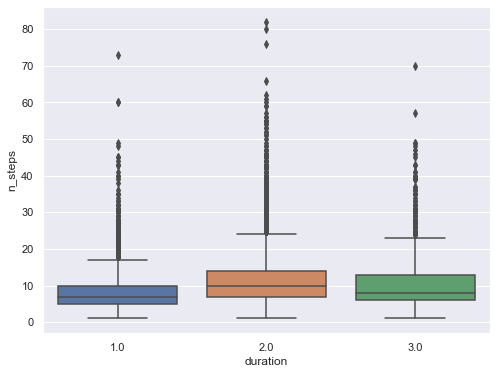

In [35]:
data = pd.concat([X["n_steps"], pd.Series(y).rename("duration")], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x="duration", y="n_steps", data=data)

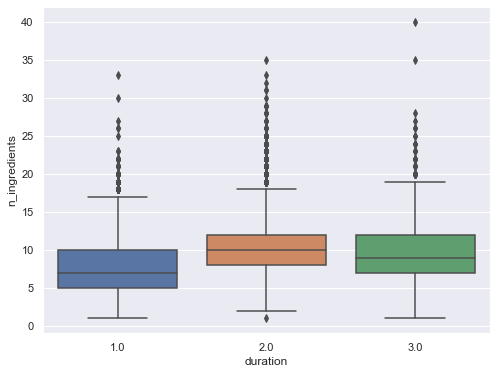

In [36]:
data = pd.concat([X["n_ingredients"], pd.Series(y).rename("duration")], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x="duration", y="n_ingredients", data=data)

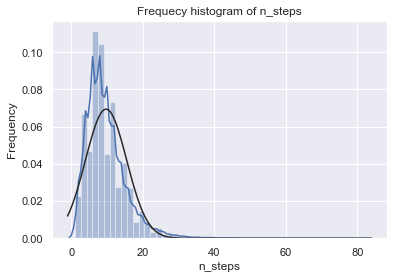

In [40]:
sns.distplot(X["n_steps"], fit=scipy.stats.norm)
plt.ylabel("Frequency")
plt.title("Frequecy histogram of n_steps")
plt.savefig("./graphs/features/before_log_n_steps.png", format="png")

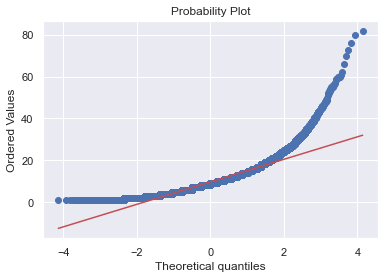

In [41]:
res = scipy.stats.probplot(X["n_steps"], plot=plt)
plt.savefig("./graphs/features/before_log_prob_plot_n_steps.png", format="png")

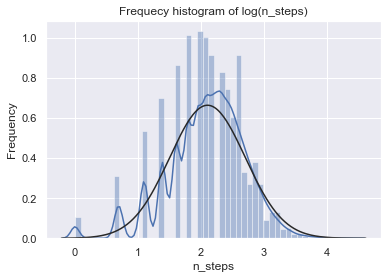

In [42]:
sns.distplot(np.log(X["n_steps"]), fit=scipy.stats.norm)
plt.ylabel("Frequency")
plt.title("Frequecy histogram of log(n_steps)")
plt.savefig("./graphs/features/log_n_steps.png", format="png")

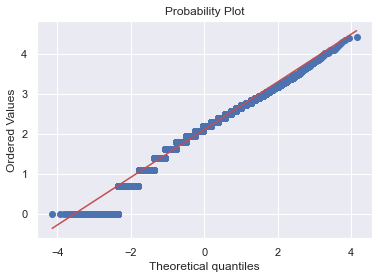

In [44]:
res = scipy.stats.probplot(np.log(X["n_steps"]), plot=plt)
plt.savefig("./graphs/features/log_prob_plot_n_steps.png", format="png")

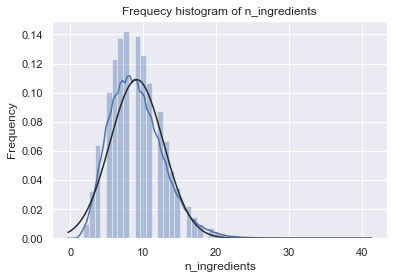

In [51]:
sns.distplot(X["n_ingredients"], fit=scipy.stats.norm)
plt.ylabel("Frequency")
plt.title("Frequecy histogram of n_ingredients")
plt.savefig("./graphs/features/before_log_n_ingredients.png", format="png")

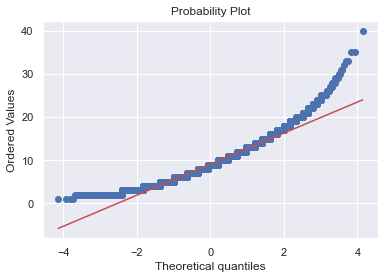

In [50]:
res = scipy.stats.probplot(X["n_ingredients"], plot=plt)
plt.savefig("./graphs/features/before_log_prob_plot_n_ingredients.png", format="png")

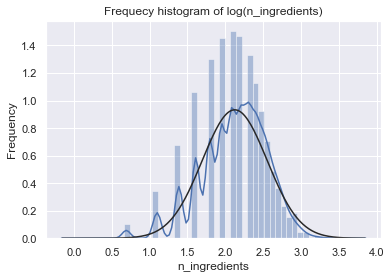

In [52]:
sns.distplot(np.log(X["n_ingredients"]), fit=scipy.stats.norm)
plt.ylabel("Frequency")
plt.title("Frequecy histogram of log(n_ingredients)")
plt.savefig("./graphs/features/log_n_ingredients.png", format="png")

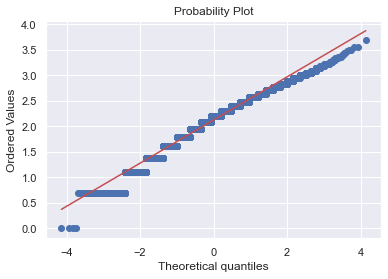

In [53]:
res = scipy.stats.probplot(np.log(X["n_ingredients"]), plot=plt)
plt.savefig("./graphs/features/log_prob_plot_n_ingredients.png", format="png")

In [23]:
train_name_vec.toarray()

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]])

In [29]:
train_name_countvec.vocabulary_

{'wi': 10597,
 'gal': 3871,
 'chicken': 1976,
 'rice': 8202,
 'stove': 9458,
 'dish': 2916,
 'healthier': 4437,
 'irish': 4801,
 'pin': 7525,
 'oats': 6903,
 'cheesy': 1925,
 'beef': 873,
 'biscuit': 1017,
 'casserole': 1740,
 'lemonade': 5606,
 'oamc': 6898,
 'graham': 4134,
 'peanut': 7321,
 'butter': 1508,
 'bon': 1155,
 'bons': 1168,
 'sourdough': 9229,
 'bread': 1287,
 'egg': 3148,
 'sausage': 8590,
 'cathie': 1763,
 'sunshine': 9581,
 'curry': 2631,
 'raspberry': 8057,
 'semifreddo': 8739,
 'baked': 676,
 'breakfast': 1299,
 'potatoes': 7769,
 'garlic': 3902,
 'dijon': 2879,
 'skirt': 9015,
 'steak': 9403,
 'sea': 8698,
 'bass': 799,
 'lemon': 5605,
 'caper': 1653,
 'fettuccine': 3479,
 'pan': 7135,
 'fried': 3777,
 'salmon': 8489,
 'warm': 10492,
 'chilli': 2005,
 'chili': 1998,
 'lime': 5674,
 'sauce': 8575,
 'heavenly': 4455,
 'blue': 1101,
 'cheese': 1913,
 'stuffed': 9501,
 'burgers': 1478,
 'turkey': 10195,
 'roll': 8308,
 'ups': 10286,
 'old': 6947,
 'england': 3236,
 'ham